In [9]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import mean_squared_error, r2_score,accuracy_score,mean_absolute_error
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression

In [3]:
df = pd.read_csv('Dataset/data.csv')

In [4]:
df = df[~(df.values.ravel() == -1).reshape(df.shape).any(1)]

In [5]:
X = df.drop(columns='Trees')
y = df['Trees']

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3255 entries, 0 to 3686
Data columns (total 25 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Point       3255 non-null   int64  
 1   Trees       3255 non-null   int64  
 2   Shrubs      3255 non-null   int64  
 3   Peren_FG    3255 non-null   int64  
 4   bare_groun  3255 non-null   int64  
 5   Annual_FG   3255 non-null   int64  
 6   ppt         3255 non-null   float64
 7   vpdmin      3255 non-null   float64
 8   vpdmax      3255 non-null   float64
 9   tmin        3255 non-null   float64
 10  tmean       3255 non-null   float64
 11  tmax        3255 non-null   float64
 12  tdmean      3255 non-null   float64
 13  slope       3255 non-null   float64
 14  dem         3255 non-null   float64
 15  aspect      3255 non-null   float64
 16  Runoff      3255 non-null   int64  
 17  Frosting_R  3255 non-null   int64  
 18  Flooding_F  3255 non-null   int64  
 19  BD_depth    3255 non-null  

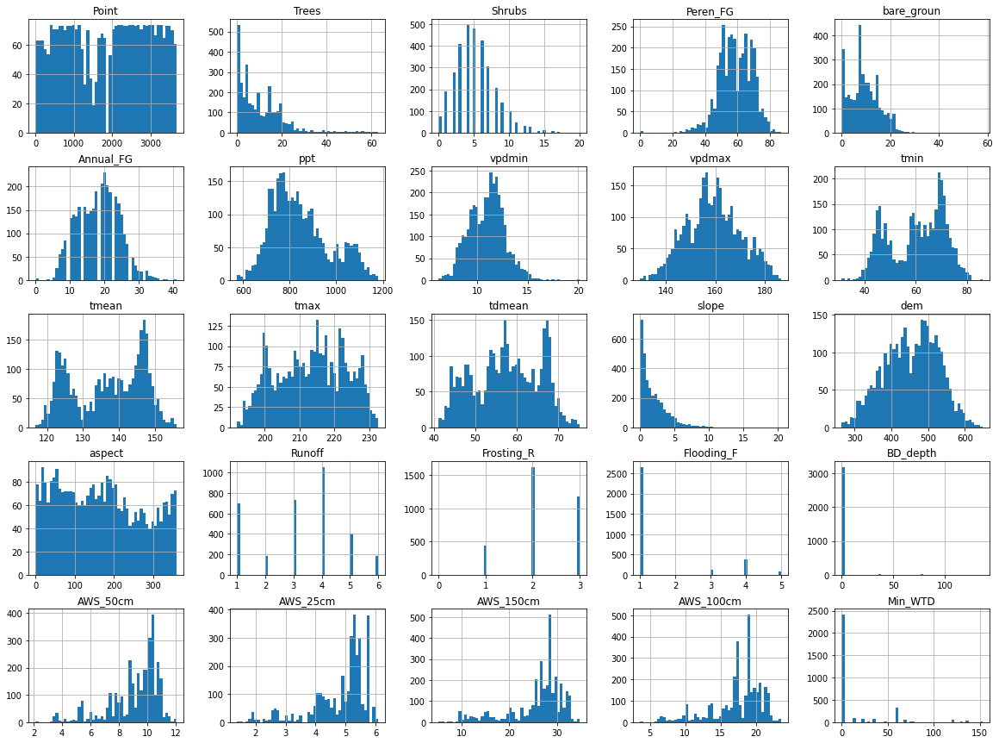

In [25]:

# Import Matplotlib for plotting
import matplotlib.pyplot as plt
%matplotlib inline

df.hist(bins=50, figsize=(20,15));

In [26]:
df.describe()

,Point,Trees,Shrubs,Peren_FG,bare_groun,Annual_FG,ppt,vpdmin,vpdmax,tmin,...,aspect,Runoff,Frosting_R,Flooding_F,BD_depth,AWS_50cm,AWS_25cm,AWS_150cm,AWS_100cm,Min_WTD
count,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,...,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000,3255.000000
mean,1889.422734,10.832565,5.148694,58.894009,9.378495,18.248233,846.317833,10.983928,159.159024,60.501688,...,166.907216,3.252227,2.224270,1.535791,1.297696,9.128857,4.836169,25.914396,17.400065,15.482335
std,1086.338346,10.674657,2.850615,10.081329,6.041388,6.022633,125.122006,1.727968,10.779365,10.762559,...,103.795275,1.475462,0.673103,1.159337,10.115931,1.737763,0.921792,5.783391,3.602901,31.828167
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,574.183000,6.207000,129.732000,31.118000,...,0.020200,1.000000,0.000000,1.000000,0.000000,2.140000,1.390000,5.140000,3.640000,0.000000
25%,894.500000,3.000000,3.000000,52.000000,5.000000,14.000000,753.029500,9.693000,151.760000,49.998000,...,75.501450,2.000000,2.000000,1.000000,0.000000,8.270000,4.380000,24.880000,16.180000,0.000000
50%,2023.000000,8.000000,5.000000,59.000000,9.000000,19.000000,823.183000,11.152000,159.055000,62.074000,...,161.941000,4.000000,2.000000,1.000000,0.000000,9.690000,5.200000,28.150000,18.600000,0.000000
75%,2840.500000,16.000000,7.000000,67.000000,13.000000,23.000000,919.703000,12.102000,166.343000,69.519000,...,250.064000,4.000000,3.000000,1.000000,0.000000,10.390000,5.480000,29.430000,19.690000,15.000000
max,3687.000000,63.000000,20.000000,87.000000,58.000000,41.000000,1179.560000,20.143000,186.481000,86.232000,...,359.965000,6.000000,3.000000,5.000000,137.000000,12.050000,6.080000,34.760000,23.570000,153.000000


<AxesSubplot:>

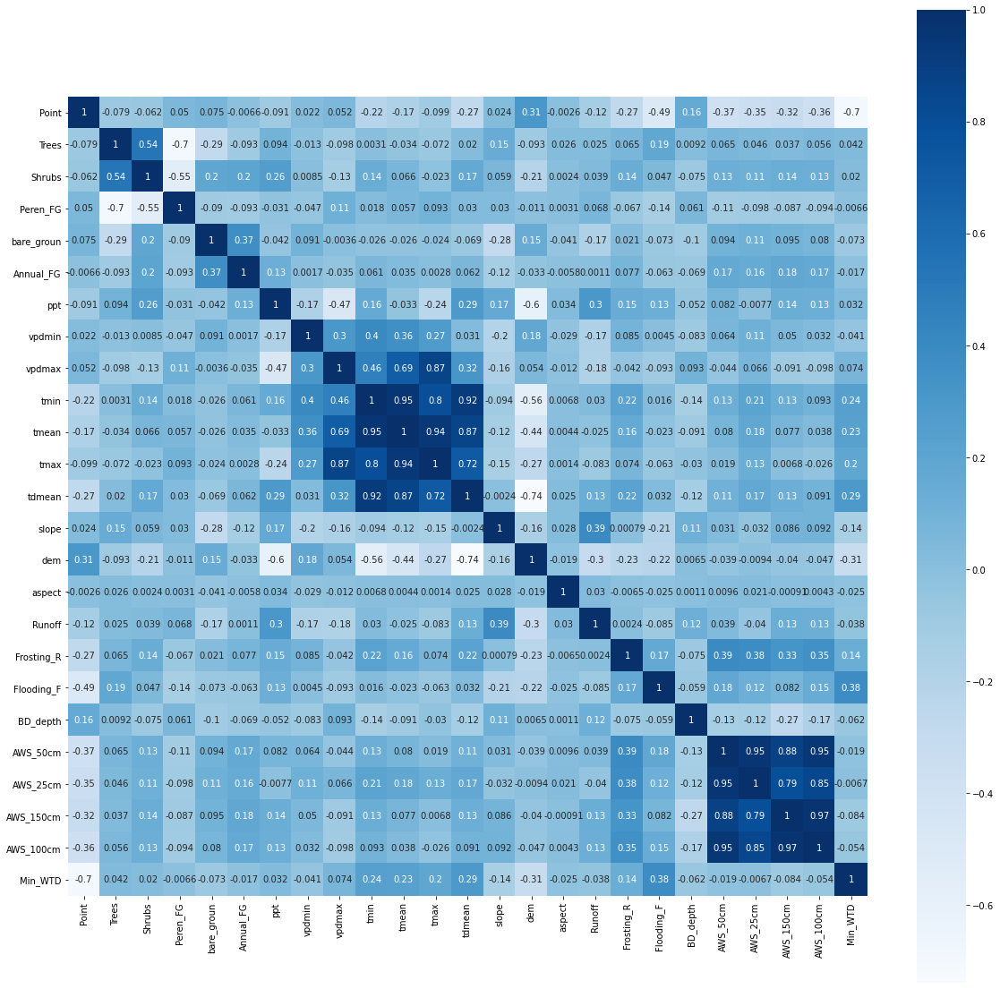

In [10]:
correlation = df.corr()

fig = plt.subplots(figsize=(20,20))
sns.heatmap(correlation,vmax=1,square=True,annot=True,cmap='Blues')

In [27]:
df.corr()['Trees'].abs().sort_values(ascending=False)

Trees         1.000000
Peren_FG      0.697547
Shrubs        0.535151
bare_groun    0.285789
Flooding_F    0.187137
slope         0.150911
vpdmax        0.098415
ppt           0.094142
Annual_FG     0.092877
dem           0.092730
Point         0.078701
tmax          0.071883
AWS_50cm      0.065248
Frosting_R    0.064551
AWS_100cm     0.056152
AWS_25cm      0.045521
Min_WTD       0.041594
AWS_150cm     0.036983
tmean         0.034487
aspect        0.025660
Runoff        0.025453
tdmean        0.019666
vpdmin        0.012806
BD_depth      0.009165
tmin          0.003114
Name: Trees, dtype: float64

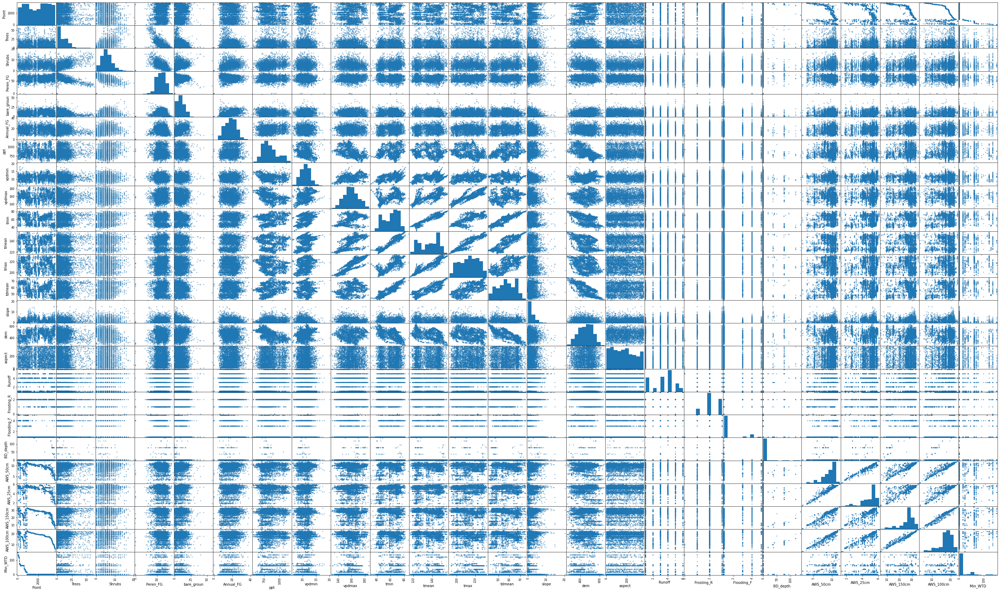

In [28]:
from pandas.plotting import scatter_matrix


sct = scatter_matrix(df, figsize=(50, 30))
plt.savefig(r"sct.png")

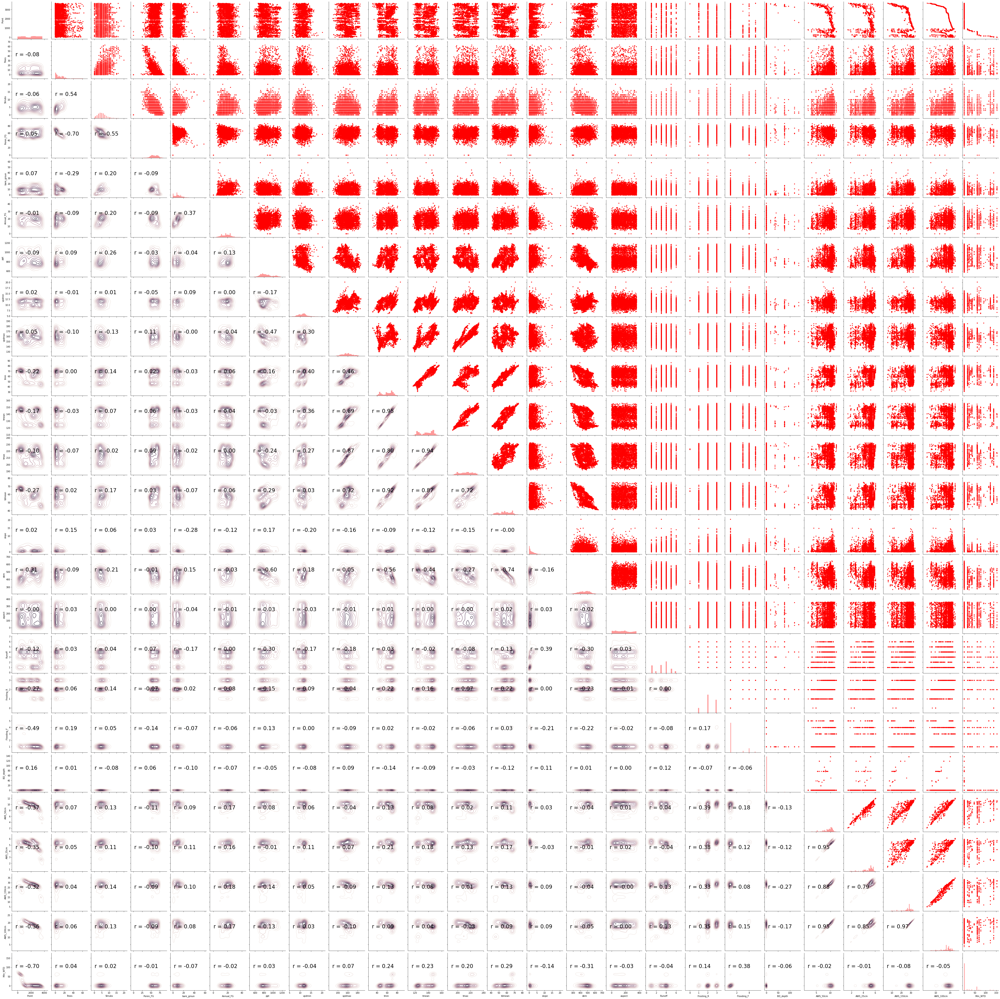

In [29]:

# Matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
from scipy import stats

# Calculate correlation coefficient
def corrfunc(x, y, **kws):
    r, _ = stats.pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.1, .6), xycoords=ax.transAxes,
               size = 24)
    
cmap = sns.cubehelix_palette(light=1, dark = 0.1,
                             hue = 0.5, as_cmap=True)

sns.set_context(font_scale=2)

# Pair grid set up
g = sns.PairGrid(df)

# Scatter plot on the upper triangle
g.map_upper(plt.scatter, s=10, color = 'red')

# Distribution on the diagonal
g.map_diag(sns.distplot, kde=False, color = 'red')

# Density Plot and Correlation coefficients on the lower triangle
g.map_lower(sns.kdeplot, cmap = cmap)
g.map_lower(corrfunc);

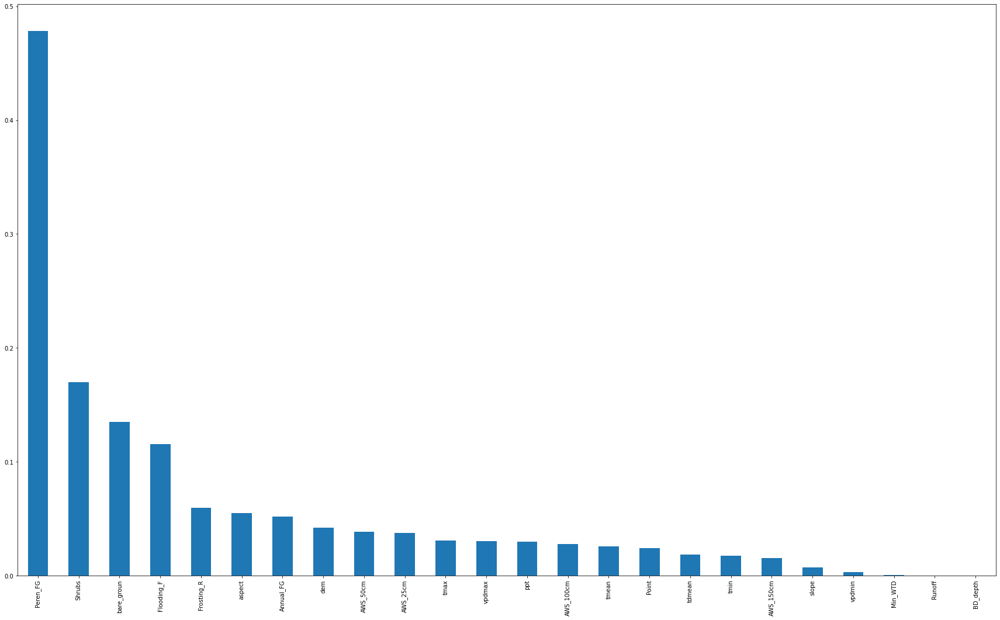

In [23]:
mutual_info = mutual_info_classif(X,y)
mi_series = pd.Series(mutual_info)
mi_series.index = X.columns
mi_series.sort_values(ascending=False).plot.bar(figsize=(30,18));

In [6]:
##Using Cross validation to test whats the score with all features included 
maxScore = 0.0
ridg_model = Ridge(alpha = 0.62,solver ='saga')
scores = cross_val_score(ridg_model, X, y, scoring='neg_mean_squared_error', cv=5)
maxScore = scores.mean()
print(maxScore)

-42.20535086548707


In [7]:
%%time
## Use backward search(Warping feature selection) to test all possible feature combination
## to run KNN for 2^11 times, as each run takes few seconds
#y = np.array(y)
count = 0
for j in range(len(X.columns)): 
    index = -1
    for i,cols in enumerate(X.columns):
        fs_df = X    
        count += 1
        fs_df = fs_df.drop(columns = fs_df.columns[i])
        ridg_model = Ridge(alpha = 0.62,solver ='saga')   
        scores = cross_val_score(ridg_model, fs_df, y, scoring='neg_mean_squared_error', cv=5)
        validation_accuracy = scores.mean()
        if validation_accuracy > maxScore:
            maxScore = validation_accuracy
            index = i
    if(index != -1):
        print('This is Dropped:',X.columns[index])
        X = X.drop(columns = X.columns[index])
    print(X.columns) 
    print('\n','='*30)

This is Dropped: Point
Index(['Shrubs', 'Peren_FG', 'bare_groun', 'Annual_FG', 'ppt', 'vpdmin',
       'vpdmax', 'tmin', 'tmean', 'tmax', 'tdmean', 'slope', 'dem', 'aspect',
       'Runoff', 'Frosting_R', 'Flooding_F', 'BD_depth', 'AWS_50cm',
       'AWS_25cm', 'AWS_150cm', 'AWS_100cm', 'Min_WTD'],
      dtype='object')

This is Dropped: Min_WTD
Index(['Shrubs', 'Peren_FG', 'bare_groun', 'Annual_FG', 'ppt', 'vpdmin',
       'vpdmax', 'tmin', 'tmean', 'tmax', 'tdmean', 'slope', 'dem', 'aspect',
       'Runoff', 'Frosting_R', 'Flooding_F', 'BD_depth', 'AWS_50cm',
       'AWS_25cm', 'AWS_150cm', 'AWS_100cm'],
      dtype='object')

This is Dropped: dem
Index(['Shrubs', 'Peren_FG', 'bare_groun', 'Annual_FG', 'ppt', 'vpdmin',
       'vpdmax', 'tmin', 'tmean', 'tmax', 'tdmean', 'slope', 'aspect',
       'Runoff', 'Frosting_R', 'Flooding_F', 'BD_depth', 'AWS_50cm',
       'AWS_25cm', 'AWS_150cm', 'AWS_100cm'],
      dtype='object')

This is Dropped: AWS_150cm
Index(['Shrubs', 'Peren_FG', 'bar

In [8]:
best_feature_mse = ['Shrubs', 'Peren_FG', 'bare_groun', 'Annual_FG', 'vpdmax', 'tmean',
       'slope', 'Runoff', 'Flooding_F', 'BD_depth']